In [1]:
import datetime
import os
import pprint

import numpy as np
from copy import deepcopy
from tianshou.data.buffer.vecbuf import VectorReplayBuffer, ReplayBuffer
from tianshou.env.venvs import SubprocVectorEnv
import torch
from torch.utils.tensorboard import SummaryWriter
from env.risky_pointmass import PointMass
from sklearn.neighbors import KernelDensity
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import plotly.graph_objects as go

from tianshou.data import Collector, Batch, to_torch
from tianshou.data.types import RolloutBatchProtocol
from tianshou.policy import DSACPolicy, BasePolicy
from tianshou.trainer import OffpolicyTrainer
from tianshou.utils import TensorboardLogger
from tianshou.utils.net.common import Net
from tianshou.utils.net.continuous import ActorProb, QuantileMlp

/data/user/R901105/.conda/envs/dev/lib/python3.11/site-packages/glfw/__init__.py:916: GLFWError: (65544) b'X11: The DISPLAY environment variable is missing'
  warnings.warn(message, GLFWError)
/data/user/R901105/.conda/envs/dev/lib/python3.11/site-packages/gymnasium/envs/registration.py:596: UserWarning: WARN: plugin: shimmy.registration:register_gymnasium_envs raised Traceback (most recent call last):
  File "/data/user/R901105/.conda/envs/dev/lib/python3.11/site-packages/gymnasium/envs/registration.py", line 594, in load_plugin_envs
    fn()
  File "/data/user/R901105/.conda/envs/dev/lib/python3.11/site-packages/shimmy/registration.py", line 262, in register_gymnasium_envs
    _register_dm_control_envs()
  File "/data/user/R901105/.conda/envs/dev/lib/python3.11/site-packages/shimmy/registration.py", line 26, in _register_dm_control_envs
    from shimmy.dm_control_compatibility import DmControlCompatibilityV0
  File "/data/user/R901105/.conda/envs/dev/lib/python3.11/site-packages/shim

In [6]:
plt.rcParams['font.size'] = 16

In [7]:
task = "PointMass"
seed = 0
risk_type = "wang"
buffer_size = 1000000
hidden_sizes = [256, 256, 256]
actor_lr = 3e-4
critic_lr = 3e-4
gamma = 0.99
tau = 0.005
alpha = 0.02
auto_alpha = True
exploration = True
alpha_lr = 3e-4
start_timesteps = 10000
epoch = 200
step_per_epoch = 500
step_per_collect = 1
update_per_step = 1
n_step = 1
batch_size = 256
training_num = 1
test_num = 10
logdir = "log"
device = "cuda:2"

In [8]:
distortion_param = -0.75
risk_penalty = 20
risk_prob = 0.95
high_state = 1.5
env = PointMass(risk_penalty=risk_penalty, risk_prob=risk_prob, high_state=high_state)

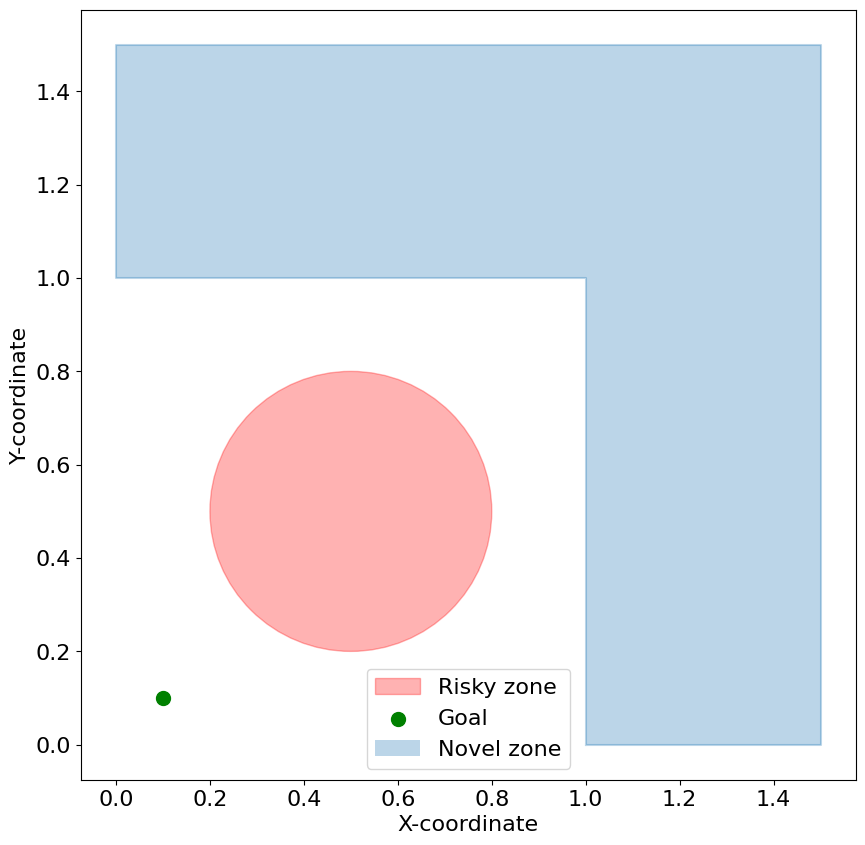

In [9]:
# Create a figure for plotting
plt.figure(figsize=(10, 10))

x = [1, 1, 0, 0, 1.5, 1.5, 1]  
y = [0, 1, 1, 1.5, 1.5, 0, 0]

# Plot the risk area
circle = plt.Circle(env.center, 0.3, color='red', alpha=0.3, label='Risky zone')
plt.gca().add_patch(circle)

# Plot the goal
plt.scatter(*env.goal, color='green', marker='o', s=100, label='Goal')
plt.plot(x, y, alpha=0.3)
plt.fill(x, y, alpha=0.3, label='Novel zone')  

plt.legend()
plt.xlabel('X-coordinate')
plt.ylabel('Y-coordinate')
plt.show()  

In [10]:
train_envs = SubprocVectorEnv([lambda: PointMass(risk_penalty=risk_penalty, risk_prob=risk_prob, high_state=high_state) for _ in range(training_num)])
test_envs = SubprocVectorEnv([lambda: PointMass(risk_penalty=risk_penalty, risk_prob=risk_prob, high_state=high_state) for _ in range(test_num)])
state_shape = env.observation_space.shape or env.observation_space.n
action_shape = env.action_space.shape or env.action_space.n
max_action = env.action_space.high[0]
print("Observations shape:", state_shape)
print("Actions shape:", action_shape)
print("Action range:", np.min(env.action_space.low), np.max(env.action_space.high))
# seed
np.random.seed(seed)
torch.manual_seed(seed)
# model
net_a = Net(state_shape, hidden_sizes=hidden_sizes, device=device)
actor = ActorProb(
    net_a,
    action_shape,
    device=device,
    unbounded=True,
    conditioned_sigma=True,
).to(device)
actor_optim = torch.optim.Adam(actor.parameters(), lr=actor_lr)

critic1 = QuantileMlp(hidden_sizes=hidden_sizes, input_size=state_shape[0] + action_shape[0], device=device).to(device)
critic1_optim = torch.optim.Adam(critic1.parameters(), lr=critic_lr)
critic2 = QuantileMlp(hidden_sizes=hidden_sizes, input_size=state_shape[0] + action_shape[0], device=device).to(device)
critic2_optim = torch.optim.Adam(critic2.parameters(), lr=critic_lr)

if auto_alpha:
    target_entropy = -np.prod(env.action_space.shape)
    log_alpha = torch.zeros(1, requires_grad=True, device=device)
    alpha_optim = torch.optim.Adam([log_alpha], lr=alpha_lr)
    alpha = (target_entropy, log_alpha, alpha_optim)

policy = DSACPolicy(
    actor,
    actor_optim,
    critic1,
    critic1_optim,
    critic2,
    critic2_optim,
    risk_type=risk_type,
    tau=tau,
    gamma=gamma,
    alpha=alpha,
    estimation_step=n_step,
    action_space=env.action_space,
    distortion_param=distortion_param,
    device=device,
)

# collector
buffer = VectorReplayBuffer(buffer_size, training_num)
train_collector = Collector(policy, train_envs, buffer, exploration_noise=exploration)
test_buffer = VectorReplayBuffer(1000*test_num, test_num)
test_collector = Collector(policy, test_envs, test_buffer)

Observations shape: (2,)
Actions shape: (2,)
Action range: -0.05 0.05


In [11]:
# log
now = datetime.datetime.now().strftime("%y%m%d-%H%M%S")
algo_name = "dsac"
risk_ = ""
if risk_type in ["wang", "cvar"]:
    risk_ = risk_type + str(distortion_param)
log_name = os.path.join(task+f"_prob{risk_prob}"+f"_pen{risk_penalty}"+f"_hs{high_state}", algo_name, risk_, str(seed), now)
log_path = os.path.join(logdir, log_name)
print(f"log path: {log_path}")

# logger
writer = SummaryWriter(log_path)
logger = TensorboardLogger(writer)

log path: log/PointMass_prob0.95_pen20_hs1.5/dsac/wang-0.75/0/240424-151831


In [12]:
def save_best_fn(policy):
    torch.save(policy.state_dict(), os.path.join(log_path, "best.pth"))

def test_fn(num_epoch: int, step_idx: int):
    torch.save(policy.state_dict(), os.path.join(log_path, "policy.pth"))

In [13]:
result = OffpolicyTrainer(
    policy=policy,
    train_collector=train_collector,
    test_collector=test_collector,
    max_epoch=epoch,
    step_per_epoch=step_per_epoch,
    step_per_collect=step_per_collect,
    episode_per_test=test_num,
    batch_size=batch_size,
    save_best_fn=save_best_fn,
    test_fn=test_fn,
    logger=logger,
    update_per_step=update_per_step,
    test_in_train=False,
).run()
pprint.pprint(result)

Epoch #1: 501it [00:13, 36.70it/s, alpha=0.874, env_step=500, gradient_step=500, len=200, loss/actor=-1.517, loss/alpha=-0.454, loss/critic1=0.010, loss/critic2=0.010, n/ep=0, n/st=1, rew=-277.34]                         


Epoch #1: test_reward: -203.648380 ± 96.127478, best_reward: -194.661469 ± 41.504057 in #0


Epoch #2: 501it [00:12, 40.39it/s, alpha=0.752, env_step=1000, gradient_step=1000, len=200, loss/actor=-2.042, loss/alpha=-0.956, loss/critic1=0.108, loss/critic2=0.108, n/ep=1, n/st=1, rew=-97.35]                         


Epoch #2: test_reward: -189.310034 ± 93.630411, best_reward: -189.310034 ± 93.630411 in #2


Epoch #3: 501it [00:12, 39.53it/s, alpha=0.648, env_step=1500, gradient_step=1500, len=200, loss/actor=-1.666, loss/alpha=-1.449, loss/critic1=0.084, loss/critic2=0.084, n/ep=0, n/st=1, rew=-211.15]                         


Epoch #3: test_reward: -99.756170 ± 27.465162, best_reward: -99.756170 ± 27.465162 in #3


Epoch #4: 501it [00:13, 37.11it/s, alpha=0.558, env_step=2000, gradient_step=2000, len=200, loss/actor=-1.649, loss/alpha=-1.923, loss/critic1=0.087, loss/critic2=0.088, n/ep=1, n/st=1, rew=-140.76]                         


Epoch #4: test_reward: -96.867563 ± 29.370876, best_reward: -96.867563 ± 29.370876 in #4


Epoch #5: 501it [00:13, 36.39it/s, alpha=0.481, env_step=2500, gradient_step=2500, len=200, loss/actor=-1.477, loss/alpha=-2.374, loss/critic1=0.090, loss/critic2=0.096, n/ep=0, n/st=1, rew=-125.26]                         


Epoch #5: test_reward: -72.481176 ± 27.601254, best_reward: -72.481176 ± 27.601254 in #5


Epoch #6:  59%|#####8    | 293/500 [00:08<00:05, 36.18it/s, alpha=0.442, env_step=2792, gradient_step=2792, len=200, loss/actor=-1.400, loss/alpha=-2.583, loss/critic1=0.097, loss/critic2=0.104, n/ep=0, n/st=1, rew=-171.62]


KeyboardInterrupt: 

In [14]:
def get_init_states(n=50, seed=None):
    if seed is not None:
        np.random.seed(seed)
    x_grid = np.linspace(0.4, 1.5, 101)
    y_grid = np.linspace(0.4, 1.5, 101)
    init_states = np.stack([(x, y) for x in x_grid for y in y_grid])
    init_states = np.array([(x, y) for x, y in init_states if np.linalg.norm(np.array((x,y))-env.center) > env.r])
    init_states = init_states[np.random.choice(len(init_states), n)]
    return init_states   

def plot_trajectories(policy, X=None, Y=None, Z=None):
    policy.eval()
    init_states = get_init_states()
    trajectories = []
    for state in init_states:
        obs, info = env.reset(init_state=state)
        done = False
        cum_reward = 0
        actions = []
        while not done:
            batch = Batch(obs=torch.from_numpy(np.expand_dims(obs, 0)).to(device), info=info)
            with torch.no_grad():
                result = policy(batch)
            act = result.act.cpu().squeeze().numpy()
            act = policy.map_action(act)
            obs, reward, terminated, truncated, info = env.step(act)
            actions.append(act)
            cum_reward += reward
            done = terminated or truncated 
        trajectories.append(env.trajectory)

    # Create a figure for plotting
    plt.figure(figsize=(10, 10))

    # Novel zone coordinates
    x = [1, 1, 0, 0, 1.5, 1.5, 1]  
    y = [0, 1, 1, 1.5, 1.5, 0, 0]

    # Plot the risk area
    circle = plt.Circle((0.5, 0.5), 0.3, color='red', alpha=0.3, label="Risk zone")
    plt.gca().add_patch(circle)

    # Plot the novel area
    plt.plot(x, y, alpha=0.3)
    plt.fill(x, y, alpha=0.3, label='Novel zone')  

    # Plot the goal
    circle = plt.Circle(env.goal, 0.01, color='green', label="Goal")
    plt.gca().add_patch(circle)

    # Plot the start states
    plt.scatter(*zip(*init_states), color='blue', marker='o', s=10, label='Start States')

    # Plot the trajectories
    for traj in trajectories:
        plt.plot(*zip(*traj), color='gray', linewidth=1, alpha=0.3)

    if X is not None:
        contour = plt.contourf(X, Y, Z>=0, cmap='viridis', alpha=0.3)
        # Create custom legend labels
        legend_labels = {1: "Safe policy takes over", 0: "Suboptimal policy takes over"}
        # Create custom legend patches
        labels = ["Safe policy takes over", "Suboptimal policy takes over"]
        colors = [contour.cmap(contour.norm(value)) for value in (1, 0)]
        patches = [mpatches.Patch(color=colors[i], label=labels[i]) for i in range(len(labels))]

        # Add legend with custom patches
        plt.legend(handles=patches)

    plt.legend()
    plt.xlabel('X-coordinate')
    plt.ylabel('Y-coordinate')
    plt.title('Trajectories from Start States to Goal')
    plt.show()      

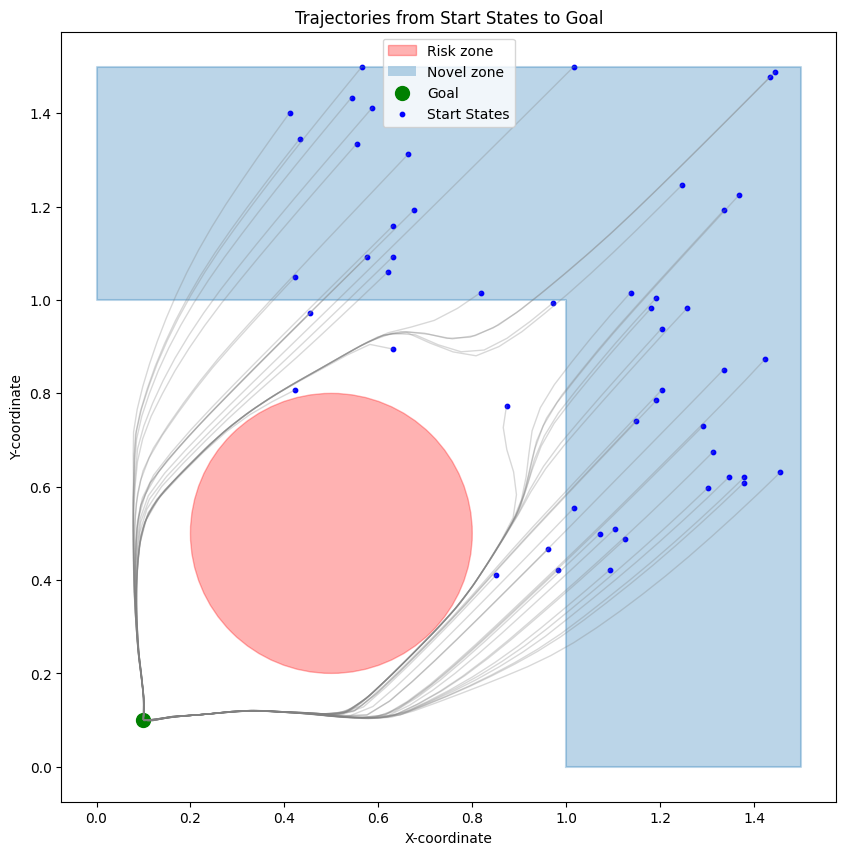

In [ ]:
plot_trajectories(policy)

In [8]:
n_samples = 100
x_grid = np.linspace(0, 1, 101)
y_grid = np.linspace(0, 1, 101)
z_values = np.zeros((101, 101))
for i, x in enumerate(x_grid):
    for j, y in enumerate(y_grid):
        env.state = np.array((x,y))
        if not env.is_safe():
            z = 0
            for _ in range(n_samples):
                reward, _ = env.get_reward()
                z += reward
            z_values[i, j] = z/n_samples
        else:
            reward, _ = env.get_reward()
            z_values[i, j] = reward

In [58]:
# Create a 2D contour plot
fig = go.Figure(data=[go.Contour(z=z_values, x=x_grid, y=y_grid)])

# Customize the layout
fig.update_layout(title='Rewards', autosize=False,
                  width=500, height=500,
                  margin=dict(l=65, r=50, b=65, t=90))

# Show the plot
fig.show()

In [15]:
def load_policy(path, distortion_param=distortion_param, alpha=alpha):
    net_a = Net(state_shape, hidden_sizes=hidden_sizes, device=device)
    actor = ActorProb(
        net_a,
        action_shape,
        device=device,
        unbounded=True,
        conditioned_sigma=True,
    ).to(device)
    actor_optim = torch.optim.Adam(actor.parameters(), lr=actor_lr)

    critic1 = QuantileMlp(hidden_sizes=hidden_sizes, input_size=state_shape[0] + action_shape[0], device=device).to(device)
    critic1_optim = torch.optim.Adam(critic1.parameters(), lr=critic_lr)
    critic2 = QuantileMlp(hidden_sizes=hidden_sizes, input_size=state_shape[0] + action_shape[0], device=device).to(device)
    critic2_optim = torch.optim.Adam(critic2.parameters(), lr=critic_lr)

    if auto_alpha:
        target_entropy = -np.prod(env.action_space.shape)
        log_alpha = torch.tensor([np.log(0.02)], requires_grad=True, device=device)
        alpha_optim = torch.optim.Adam([log_alpha], lr=alpha_lr)
        alpha = (target_entropy, log_alpha, alpha_optim)

    policy = DSACPolicy(
        actor,
        actor_optim,
        critic1,
        critic1_optim,
        critic2,
        critic2_optim,
        risk_type=risk_type,
        tau=tau,
        gamma=gamma,
        alpha=alpha,
        estimation_step=n_step,
        action_space=env.action_space,
        distortion_param=distortion_param,
        device=device,
    )
    policy.load_state_dict(torch.load(path, map_location=device))
    print("Loaded agent from: ", path)
    return policy

# Epistemic Uncertainty

In [16]:
def epistemic_uncertainty(paths, states):
    states = Batch(obs=states, info={})
    policies = [load_policy(p) for p in paths]
    policies = [p.eval() for p in policies]
    results = np.stack([p(states).act.cpu().detach().numpy() for p in policies])
    return np.mean(np.std(results, 0), -1)

In [17]:
path1 = "/data/user/R901105/dev/my_fork/tianshou/log/PointMass_prob0.95_pen10_hs1/dsac/wang-0.75/0/240110-092605/policy.pth"
path2 = "/data/user/R901105/dev/my_fork/tianshou/log/PointMass_prob0.95_pen10_hs1/dsac/wang-0.75/123/240110-094642/policy.pth"
path3 = "/data/user/R901105/dev/my_fork/tianshou/log/PointMass_prob0.95_pen10_hs1/dsac/wang-0.75/159/240110-145011/policy.pth"
path4 = "/data/user/R901105/dev/my_fork/tianshou/log/PointMass_prob0.95_pen10_hs1/dsac/wang-0.75/456/240110-101135/policy.pth"
path5 = "/data/user/R901105/dev/my_fork/tianshou/log/PointMass_prob0.95_pen10_hs1/dsac/wang-0.75/789/240110-104245/policy.pth"

paths = [path1, path2, path3, path4, path5]

In [18]:
states = (torch.rand(1000, 2) * 1.5).to(device)

In [19]:
uncertainties = epistemic_uncertainty(paths, states)

Loaded agent from:  /data/user/R901105/dev/my_fork/tianshou/log/PointMass_prob0.95_pen10_hs1/dsac/wang-0.75/0/240110-092605/policy.pth
Loaded agent from:  /data/user/R901105/dev/my_fork/tianshou/log/PointMass_prob0.95_pen10_hs1/dsac/wang-0.75/123/240110-094642/policy.pth
Loaded agent from:  /data/user/R901105/dev/my_fork/tianshou/log/PointMass_prob0.95_pen10_hs1/dsac/wang-0.75/159/240110-145011/policy.pth
Loaded agent from:  /data/user/R901105/dev/my_fork/tianshou/log/PointMass_prob0.95_pen10_hs1/dsac/wang-0.75/456/240110-101135/policy.pth
Loaded agent from:  /data/user/R901105/dev/my_fork/tianshou/log/PointMass_prob0.95_pen10_hs1/dsac/wang-0.75/789/240110-104245/policy.pth


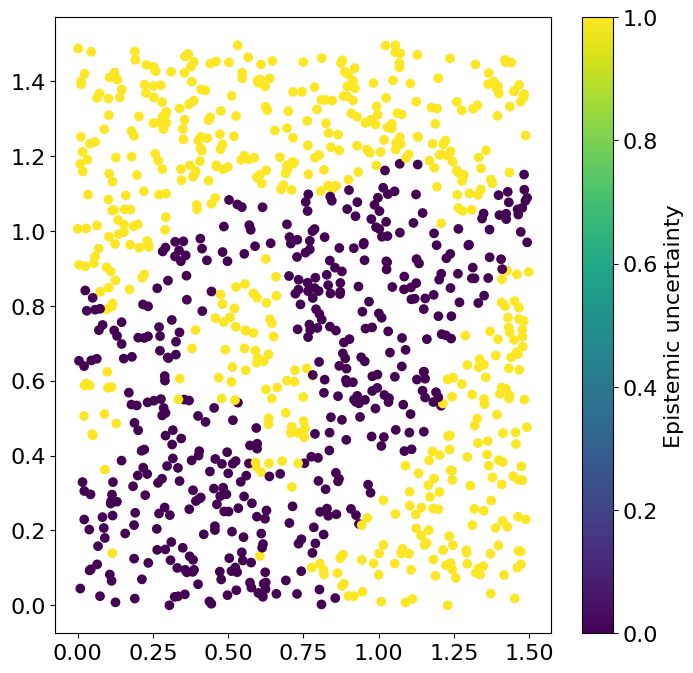

In [20]:
plt.figure(figsize=(8, 8))
sc = plt.scatter(states.cpu()[:, 0], states.cpu()[:, 1], c=uncertainties>0.05, cmap='viridis')
plt.colorbar(sc, label='Epistemic uncertainty')
plt.show()

# Novelty using KDE

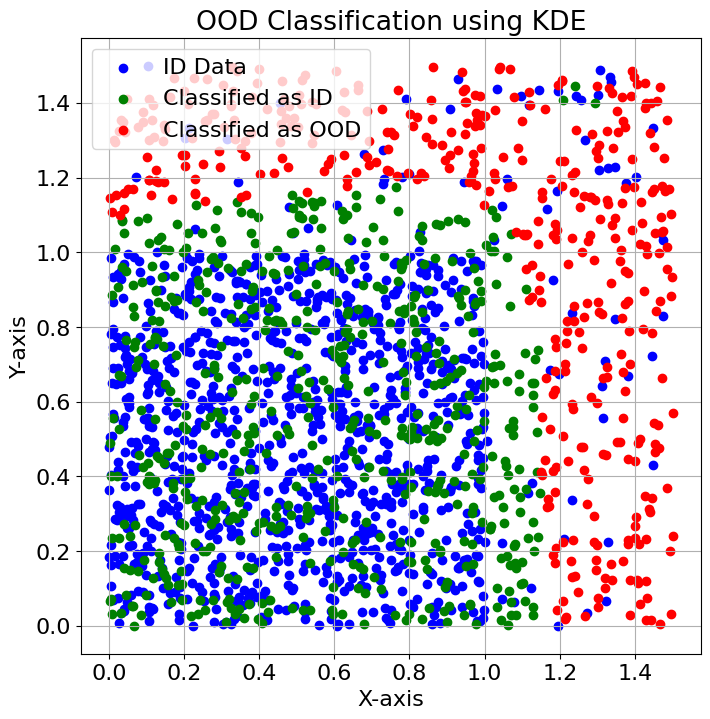

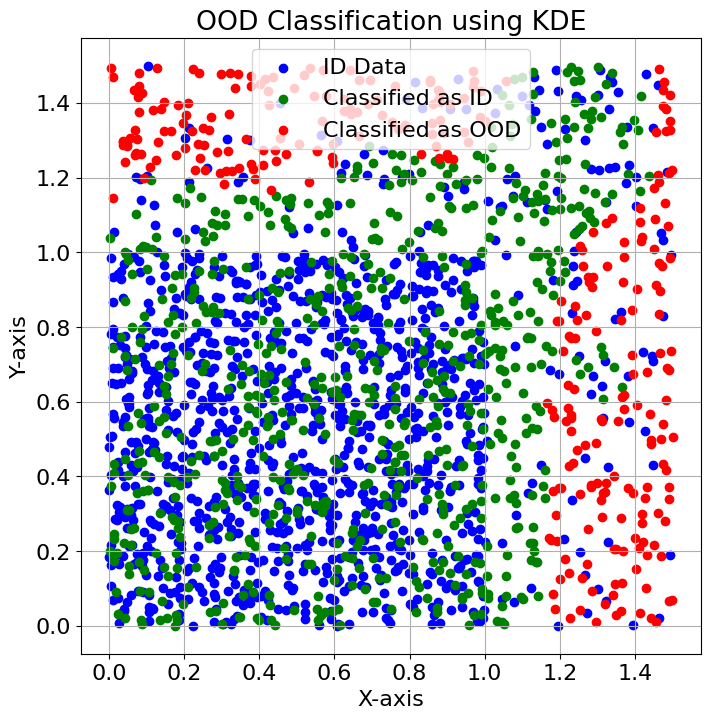

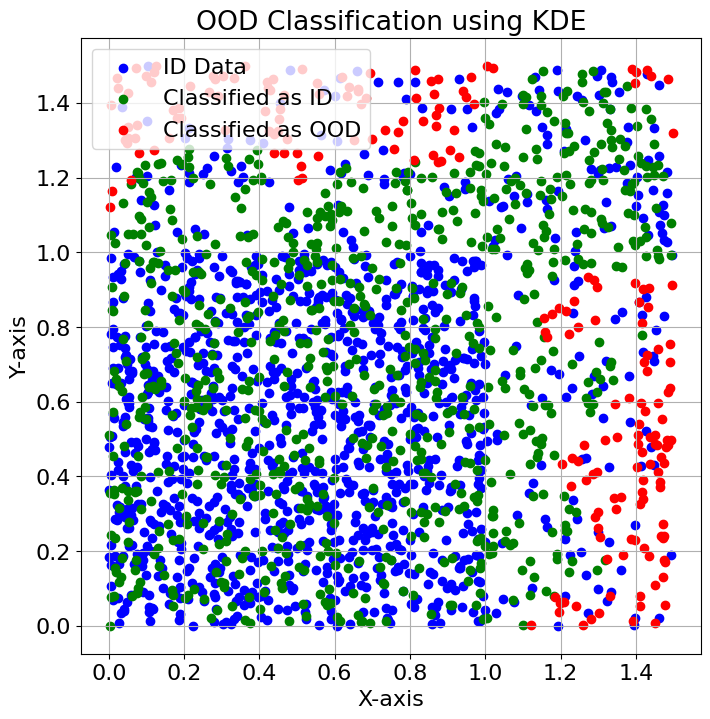

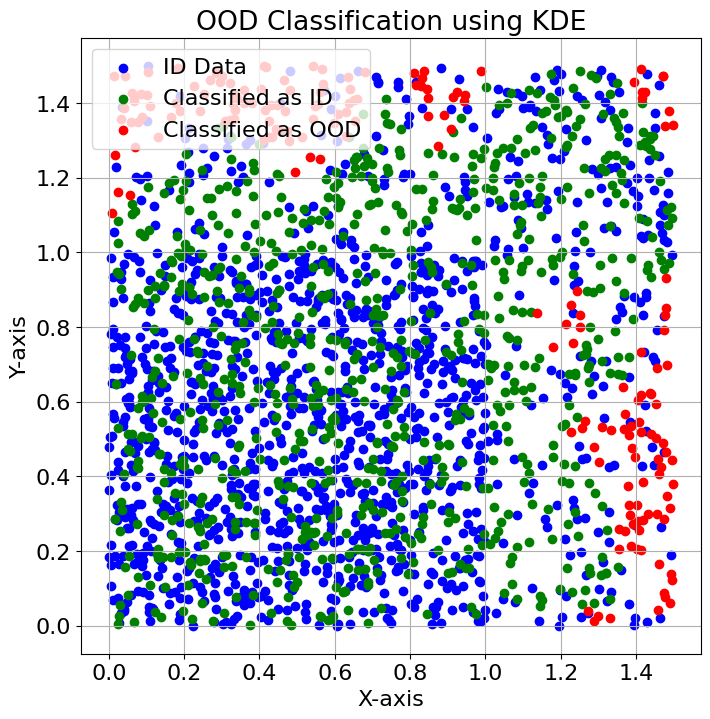

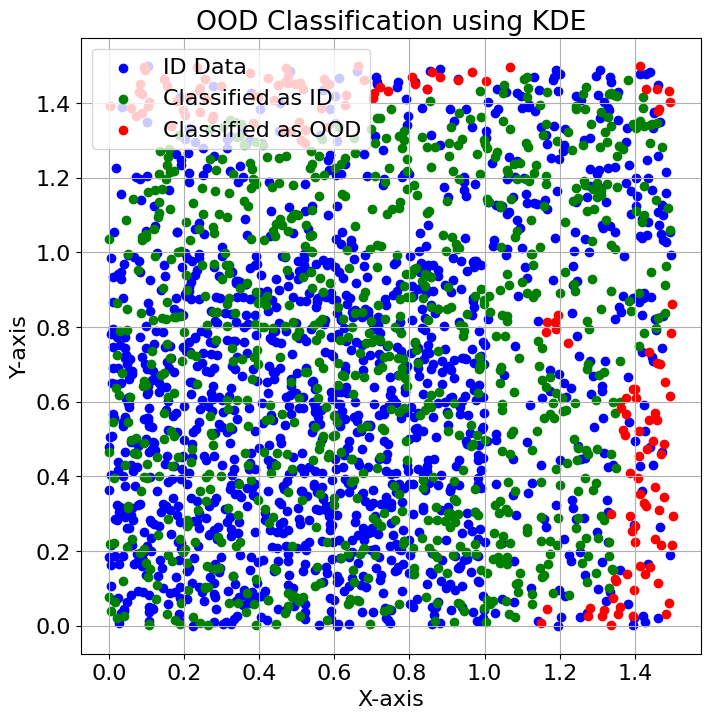

...

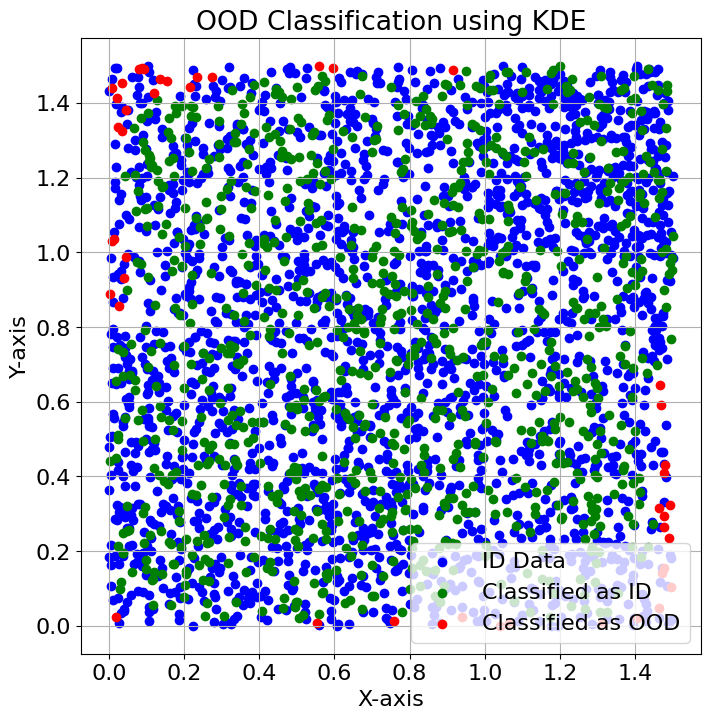

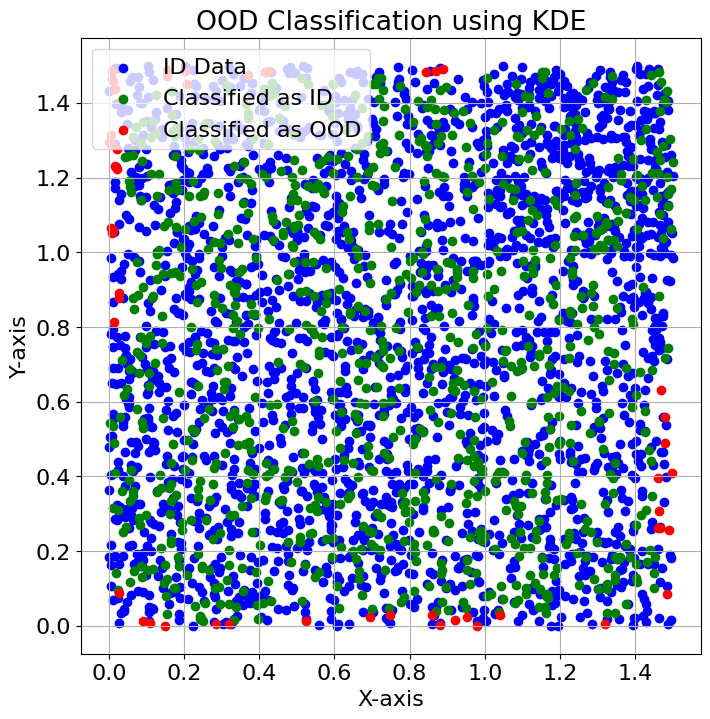

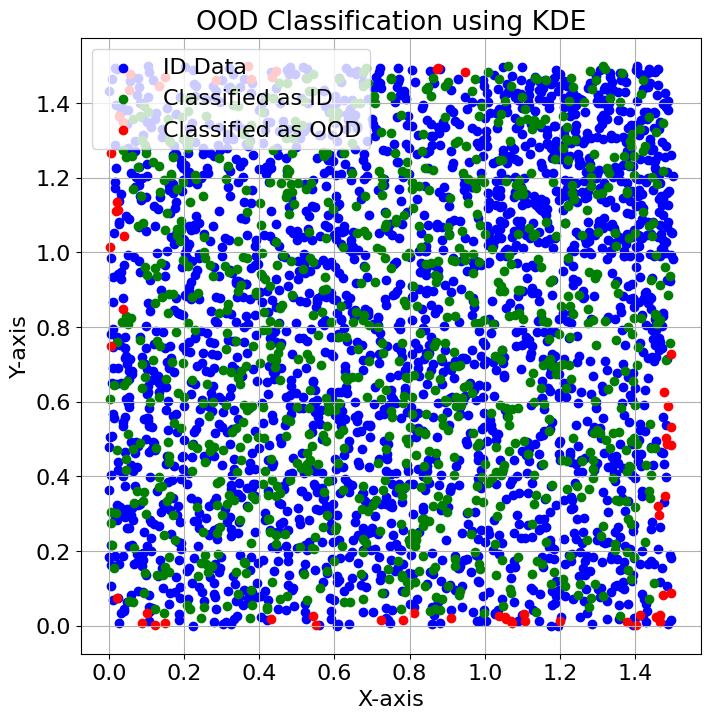

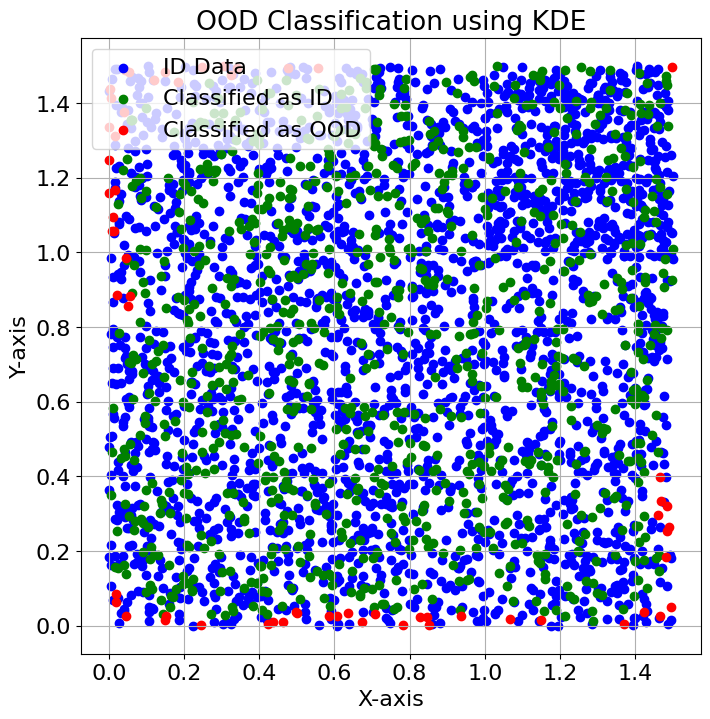

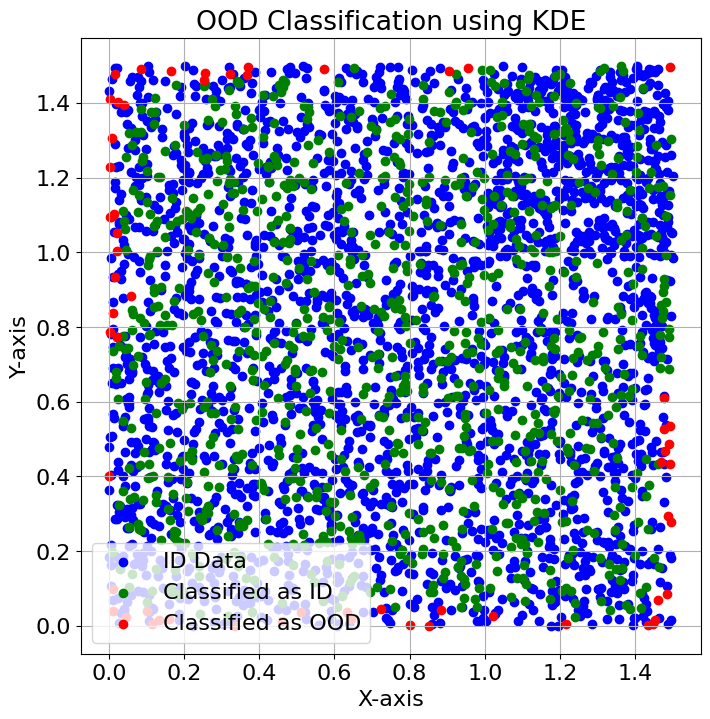

In [22]:
# Generate ID data points within the unit square
n_id_points = 1000
n_new_points = 25
id_data = np.random.uniform(0, 1, (n_id_points, 2))

for _ in range(20):
    new_id_data_x = np.random.uniform(0, 1, n_new_points)
    new_id_data_y = np.random.uniform(1, 1.5, n_new_points)
    id_data = np.concatenate([id_data, list(zip(new_id_data_x, new_id_data_y))])
    new_id_data_y = np.random.uniform(0, 1, n_new_points)
    new_id_data_x = np.random.uniform(1, 1.5, n_new_points)
    id_data = np.concatenate([id_data, list(zip(new_id_data_x, new_id_data_y))])
    new_id_data = np.random.uniform(1, 1.5, (n_new_points, 2))
    id_data = np.concatenate([id_data, new_id_data])

    # Fit KDE to ID data
    kde = KernelDensity(kernel='gaussian', bandwidth=0.1).fit(id_data)

    # Generate test points
    n_test_points = 1000
    test_data = np.random.uniform(0, 1.5, (n_test_points, 2))

    # Compute log density scores
    log_dens = kde.score_samples(test_data)
    density_threshold = np.percentile(kde.score_samples(id_data), 5)  # Threshold at the 10th percentile

    # Classify as ID or OOD
    is_id = log_dens > density_threshold

    # Plotting
    plt.figure(figsize=(8, 8))
    plt.scatter(id_data[:, 0], id_data[:, 1], c='blue', label='ID Data')
    plt.scatter(test_data[is_id, 0], test_data[is_id, 1], c='green', label='Classified as ID')
    plt.scatter(test_data[~is_id, 0], test_data[~is_id, 1], c='red', label='Classified as OOD')
    plt.title('OOD Classification using KDE')
    plt.xlabel('X-axis')
    plt.ylabel('Y-axis')
    plt.legend()
    plt.grid(True)
    plt.show()

Loaded agent from:  /data/user/R901105/dev/my_fork/tianshou/log/PointMass_prob0.95_pen20_hs1.5/dsac/wang0.75/0/240111-114541/policy.pth


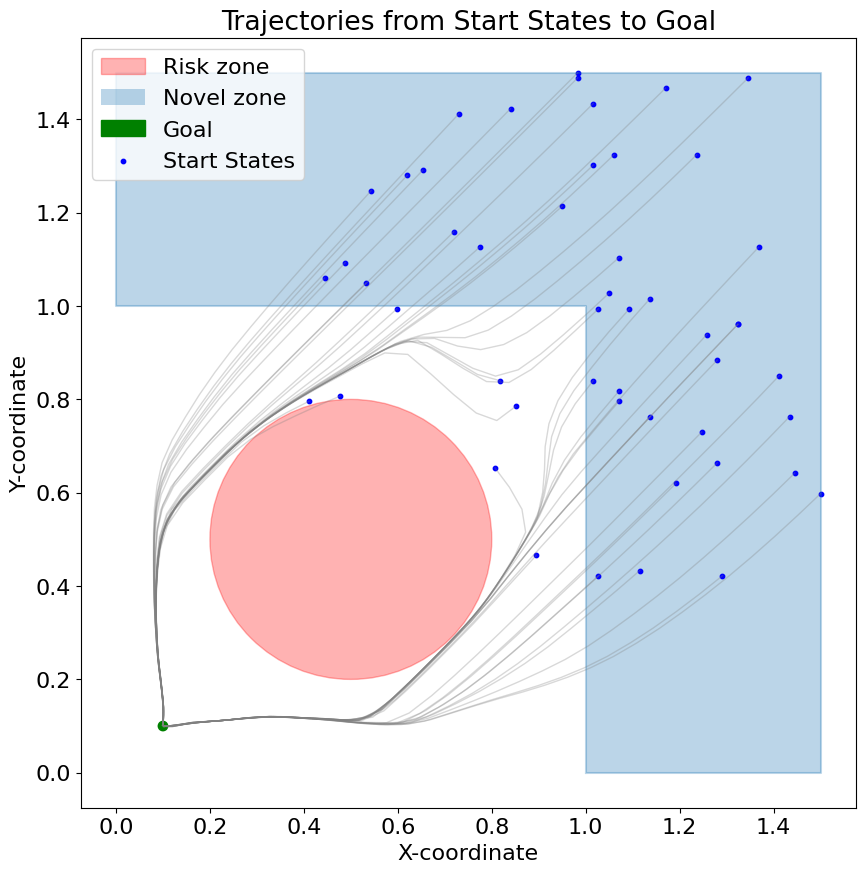

In [23]:
safe_policy_path = "/data/user/R901105/dev/my_fork/tianshou/log/PointMass_prob0.95_pen20_hs1.5/dsac/wang0.75/0/240111-114541/policy.pth"
safe_policy = load_policy(safe_policy_path)
plot_trajectories(safe_policy)

Loaded agent from:  /data/user/R901105/dev/my_fork/tianshou/log/PointMass_prob0.95_pen20/dsac/wang-0.75/0/240116-111416/policy.pth


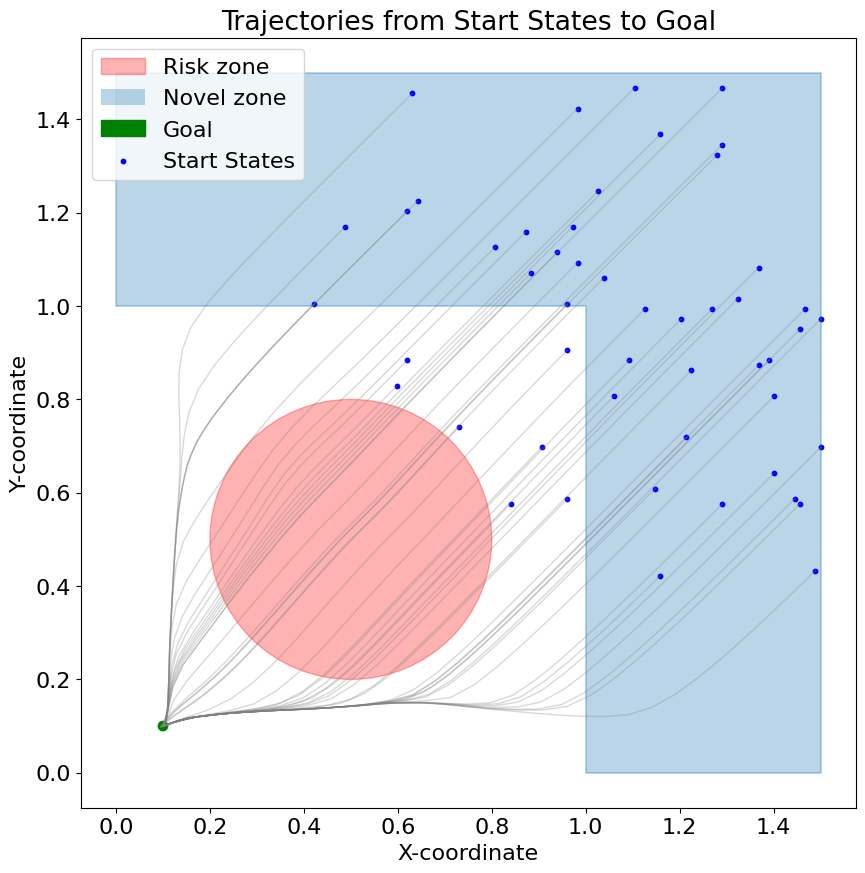

In [59]:
risky_policy_path = "/data/user/R901105/dev/my_fork/tianshou/log/PointMass_prob0.95_pen20/dsac/wang-0.75/0/240116-111416/policy.pth"
risky_policy =  load_policy(risky_policy_path, distortion_param=0.75)
plot_trajectories(risky_policy)

In [25]:
def get_qvalues(policy):
    policy.eval()
    x_grid = np.linspace(0, 1, 21)
    y_grid = np.linspace(0, 1, 21)
    init_states = np.array([(i, j) for i in x_grid for j in y_grid])
    qs = []
    for state in init_states:
        batch = Batch(obs=torch.from_numpy(np.expand_dims(state, 0)).to(dtype=torch.float32, device=device), info={})
        with torch.no_grad():
            result = policy(batch)
            q_values1 = policy.critic1(batch.obs, result.act)
            q_values2 = policy.critic2(batch.obs, result.act)
            q_values = torch.minimum(q_values1, q_values2).cpu().numpy()
        qs.append(q_values)
    return np.array(qs).squeeze()

In [26]:
rvs = []
for _ in range(10):
    risky_qvalues = get_qvalues(risky_policy)
    rvs.append(risky_qvalues)

In [27]:
svs = []
for _ in range(10) :
    safe_qvalues = get_qvalues(safe_policy)
    svs.append(safe_qvalues)

In [28]:
rvs = np.stack(rvs)
svs = np.stack(svs)

In [29]:
rvs.std(0)

array([[0.03468169, 0.03895481, 0.02496995, ..., 0.01048725, 0.00661811,
        0.01341793],
       [0.02547813, 0.03289015, 0.03200254, ..., 0.01204247, 0.01036854,
        0.01210659],
       [0.01674034, 0.0110796 , 0.01881708, ..., 0.02332071, 0.01768508,
        0.01374266],
       ...,
       [0.10240538, 0.3400774 , 0.36080742, ..., 0.12066051, 0.13993622,
        0.10254351],
       [0.08409327, 0.25800198, 0.47106978, ..., 0.12334733, 0.16345741,
        0.13366237],
       [0.09800611, 0.3848847 , 0.5260685 , ..., 0.0986182 , 0.10763687,
        0.13619864]], dtype=float32)

In [30]:
list(zip(risky_qvalues[:, 0], safe_qvalues[:, 0]))

[(0.0506462, 0.18599127),
 (0.27200252, 0.322755),
 (0.27036807, 0.29178175),
 (0.34635726, 0.34712163),
 (0.24973743, 0.21449962),
 (0.028524151, -0.09093335),
 (-0.24872641, -0.34171027),
 (-0.66219527, -0.73561656),
 (-1.1342672, -1.0429178),
 (-1.5325646, -1.5057553),
 (-2.2083464, -2.049625),
 (-2.9023895, -2.6179738),
 (-3.3393667, -3.4953446),
 (-4.2360005, -3.9579608),
 (-4.9031034, -4.7621),
 (-5.6665626, -5.399732),
 (-6.421446, -6.6022625),
 (-7.3880434, -7.118385),
 (-8.2978735, -8.374665),
 (-9.171061, -9.27479),
 (-9.82967, -10.278226),
 (0.21175772, 0.2956259),
 (0.4006239, 0.4952602),
 (0.4602572, 0.44484994),
 (0.568171, 0.4821128),
 (0.2392975, 0.30703092),
 (0.020466464, 0.010378238),
 (-0.21526782, -0.33404645),
 (-0.7343624, -0.6547054),
 (-1.012877, -1.0160552),
 (-1.5527278, -1.4703315),
 (-2.313879, -2.0027666),
 (-2.637056, -2.6073062),
 (-3.2104318, -3.2343903),
 (-4.0829186, -3.8321223),
 (-4.945831, -4.568366),
 (-5.5557256, -5.3784237),
 (-6.891814, -6.4999

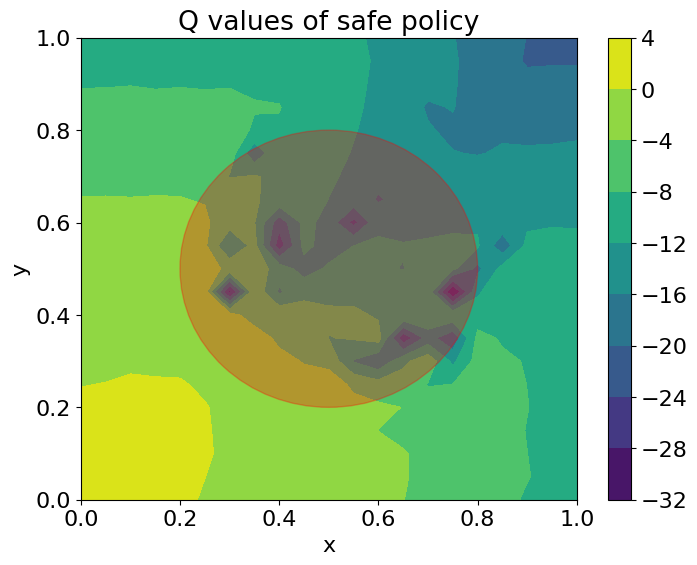

In [31]:
X = np.linspace(0, 1, 21)
Y = np.linspace(0, 1, 21)
Z = safe_qvalues[:, 0]
# Reshape Z to a 21x21 grid
Z_reshaped = Z.reshape(21, 21)

# Create a meshgrid for X and Y
X, Y = np.meshgrid(X, Y)

# Create contour plot
plt.figure(figsize=(8, 6))
contour = plt.contourf(X, Y, Z_reshaped, cmap='viridis')
# Plot the risk area
circle = plt.Circle((0.5, 0.5), 0.3, color='red', alpha=0.3, label="Risk zone")

plt.colorbar(contour)
plt.gca().add_patch(circle)
plt.title('Q values of safe policy')
plt.xlabel('x')
plt.ylabel('y')
plt.show()

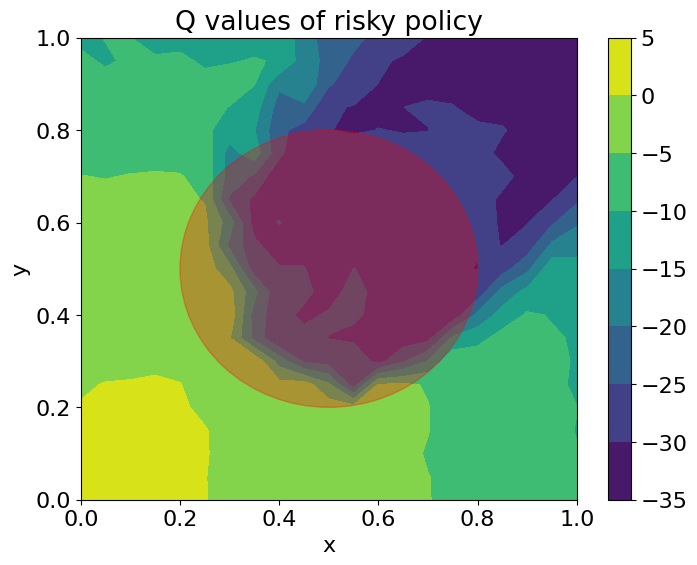

In [32]:
Z = risky_qvalues[:, 0]
# Reshape Z to a 21x21 grid
Z_reshaped = Z.reshape(21, 21)

# Create contour plot
plt.figure(figsize=(8, 6))
contour = plt.contourf(X, Y, Z_reshaped, cmap='viridis')
# Plot the risk area
circle = plt.Circle((0.5, 0.5), 0.3, color='red', alpha=0.3, label="Risk zone")

plt.colorbar(contour)
plt.gca().add_patch(circle)
plt.title('Q values of risky policy')
plt.xlabel('x')
plt.ylabel('y')
plt.show()

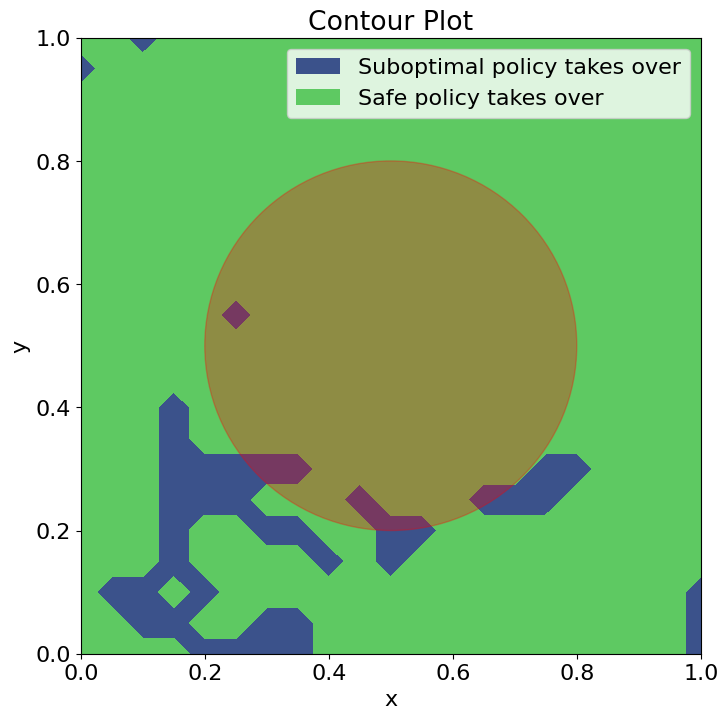

In [33]:
Z = -rvs.mean(0)[:, 0] + svs.mean(0)[:, 0]

# Reshape Z to a 21x21 grid
Z_reshaped = Z.reshape(21, 21)

# Create contour plot
plt.figure(figsize=(8, 8))
contour = plt.contourf(X, Y, Z_reshaped>0, cmap='viridis')
# Plot the risk area
circle = plt.Circle((0.5, 0.5), 0.3, color='red', alpha=0.3, label="Risk zone")
# Create custom legend labels
legend_labels = {1: "Safe policy takes over", 0: "Suboptimal policy takes over"}
# Add legend with custom labels
handles, _ = contour.legend_elements()
plt.legend(handles, [legend_labels[i] for i in range(2)])
plt.gca().add_patch(circle)
plt.title('Contour Plot')
plt.xlabel('x')
plt.ylabel('y')
plt.show()

In [34]:
class MixedPolicy(BasePolicy):
    def __init__(self, base_policy: BasePolicy, expert_policy: BasePolicy, action_space, id_data):
        super().__init__(action_space=action_space, action_scaling=True)
        self.base_policy = base_policy
        self.expert_policy = expert_policy
        self.update_kde(id_data)
        self.cede_ctrl_prob = 1

    def update_kde(self, id_data):
        self.kde = KernelDensity(kernel='epanechnikov', bandwidth=0.1).fit(id_data)
        self.density_threshold = np.percentile(self.kde.score_samples(id_data), 1)  

    def forward(self, batch: RolloutBatchProtocol, state=None, n_repeat=100, **kwargs):
        bsz = len(batch.obs)
        batch = to_torch(batch, dtype=torch.float32, device=device)
        _batch = Batch(**{'obs': deepcopy(batch.obs.repeat(n_repeat, 1)), 'info': None})
        self.base_policy.eval()
        self.expert_policy.eval()
        with torch.no_grad():
            expert_result = self.expert_policy(_batch)
            base_result = self.base_policy(_batch)
            repeated_expert_qvalues1 = self.expert_policy.critic1(_batch.obs, expert_result.act).reshape(n_repeat, bsz, -1)
            repeated_expert_qvalues2 = self.expert_policy.critic2(_batch.obs, expert_result.act).reshape(n_repeat, bsz, -1)
            expert_qvalues1 = repeated_expert_qvalues1.mean(0)
            expert_qvalues2 = repeated_expert_qvalues2.mean(0)
            expert_qvalues1_std = repeated_expert_qvalues1.std(0)
            expert_qvalues2_std = repeated_expert_qvalues2.std(0)
            expert_qvalues_std = (expert_qvalues1_std + expert_qvalues2_std) * .5
            expert_qvalues = torch.minimum(expert_qvalues1, expert_qvalues2)
            repeated_base_qvalues1 = self.base_policy.critic1(_batch.obs, base_result.act).reshape(n_repeat, bsz, -1)
            repeated_base_qvalues2 = self.base_policy.critic2(_batch.obs, base_result.act).reshape(n_repeat, bsz, -1)
            base_qvalues1 = repeated_base_qvalues1.mean(0)
            base_qvalues2 = repeated_base_qvalues2.mean(0)
            base_qvalues1_std = repeated_base_qvalues1.std(0)
            base_qvalues2_std = repeated_base_qvalues2.std(0)
            base_qvalues = torch.minimum(base_qvalues1, base_qvalues2)
            base_qvalues_std = (base_qvalues1_std + base_qvalues2_std) * .5
        risky = base_qvalues[:, 0] - base_qvalues_std[:, 0] < expert_qvalues[:, 0] - expert_qvalues_std[:, 0]
        log_dens = self.kde.score_samples(batch.obs.cpu().numpy())
        novel = log_dens < self.density_threshold
        novel = to_torch(novel, dtype=torch.float32, device=device)
        cede_ctrl = torch.logical_or(risky, novel)
        # if bsz == 1:
        #     not_cede_ctrl = ~cede_ctrl * (torch.rand(1, device=device) >= self.cede_ctrl_prob)
        #     cede_ctrl = ~not_cede_ctrl
        cede_ctrl = cede_ctrl.unsqueeze(-1)
        actions = torch.where(cede_ctrl, expert_result.act[0], base_result.act[0])
        self.cede_ctrl_prob *= 0.99999
        return Batch(**{'act': actions, 'policy': Batch({'cede_ctrl': cede_ctrl, 'novel': novel, 'risky': risky})})

    def train(self, mode: bool = True) -> "MixedPolicy":
        self.base_policy.train(mode)
        return self
    
    def process_fn(self, batch: RolloutBatchProtocol, buffer: ReplayBuffer, indices: np.ndarray) -> RolloutBatchProtocol:
        return self.base_policy.process_fn(batch, buffer, indices)

    def learn(self, batch, **kwargs):
        # cede_ctrl = batch.policy.cede_ctrl.cpu().squeeze()
        # batch = batch[~cede_ctrl]
        info = self.base_policy.learn(batch)
        return info

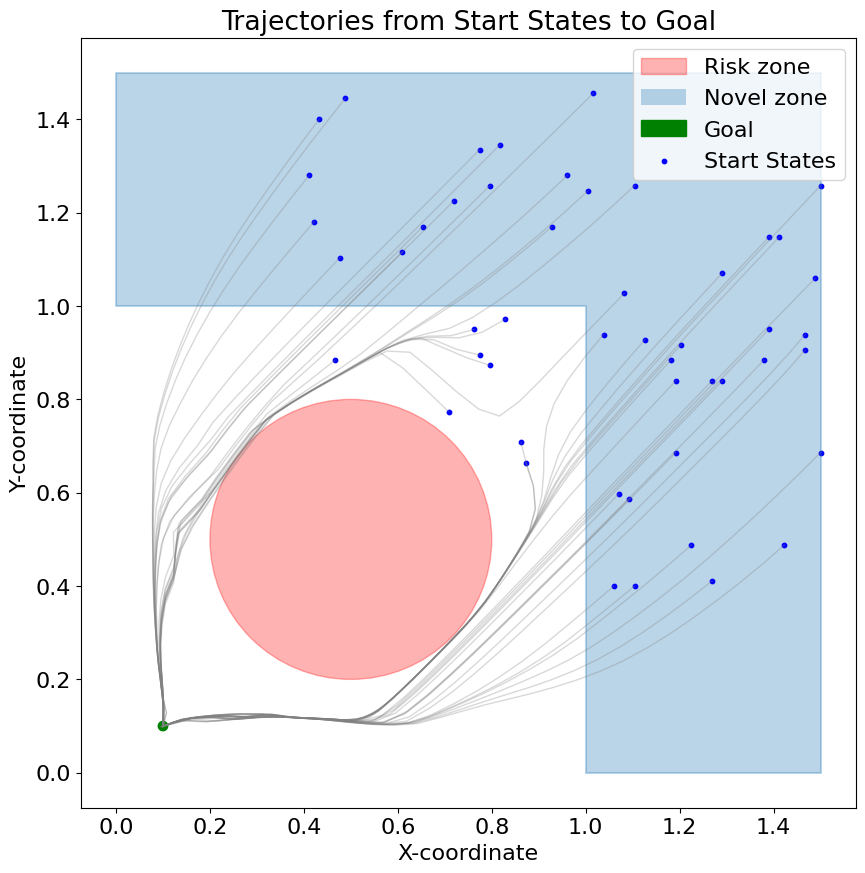

In [35]:
id_data = np.random.uniform(0, 1, (1000, 2))
mixed_policy = MixedPolicy(risky_policy, safe_policy, env.action_space, id_data)
plot_trajectories(mixed_policy)

In [44]:
def get_returns(policy, init_states, return_cede_ctrl=False):
    policy.eval()
    returns = []
    cede_ctrl = []
    novel = []
    risky = []
    for state in init_states:
        obs, info = env.reset(init_state=state)
        done = False
        cum_reward = 0
        actions = []
        if return_cede_ctrl:
            cctrl_ep = []
            novel_ep = []
            risky_ep = []
        while not done:
            batch = Batch(obs=torch.from_numpy(np.expand_dims(obs, 0)).to(device), info=info)
            with torch.no_grad():
                result = policy(batch)
            act = result.act.cpu().squeeze().numpy()
            act = policy.map_action(act)
            if return_cede_ctrl:
                cctrl_ep.append(result.policy.cede_ctrl.cpu().squeeze().numpy())
                novel_ep.append(result.policy.novel.cpu().squeeze().numpy())
                risky_ep.append(result.policy.risky.cpu().squeeze().numpy())
            obs, reward, terminated, truncated, info = env.step(act)
            actions.append(act)
            cum_reward += reward
            done = terminated or truncated
        returns.append(cum_reward)
        if return_cede_ctrl:
            cede_ctrl.append(np.array(cctrl_ep).mean())
            novel.append(np.array(novel_ep).mean())
            risky.append(np.array(risky_ep).mean())
    if return_cede_ctrl:
        return np.array(returns),  np.array(cede_ctrl).mean(), np.array(novel).mean(), np.array(risky).mean()
    return np.array(returns)

In [45]:
init_states = get_init_states(500)

In [46]:
safe_returns = get_returns(safe_policy, init_states)

In [47]:
risky_returns = get_returns(risky_policy, init_states)

In [48]:
mixed_returns = get_returns(mixed_policy, init_states)

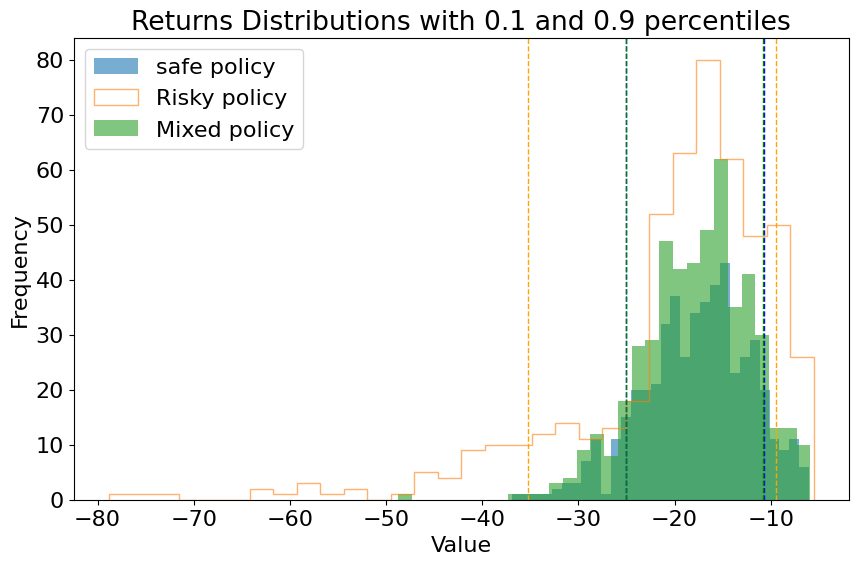

In [49]:
percentile_10_safe = np.percentile(safe_returns, 10)
percentile_90_safe = np.percentile(safe_returns, 90)
percentile_10_risky = np.percentile(risky_returns, 10)
percentile_90_risky = np.percentile(risky_returns, 90)
percentile_10_mixed = np.percentile(mixed_returns, 10)
percentile_90_mixed = np.percentile(mixed_returns, 90)

plt.figure(figsize=(10, 6))
# Histograms with different styles
plt.hist(safe_returns, bins=30, alpha=0.6, label='safe policy', histtype='stepfilled')
plt.hist(risky_returns, bins=30, alpha=0.6, label='Risky policy', histtype='step')
plt.hist(mixed_returns, bins=30, alpha=0.6, label='Mixed policy', histtype='barstacked')

# Percentile lines
plt.axvline(percentile_10_safe, color='blue', linestyle='dashed', linewidth=1)
plt.axvline(percentile_90_safe, color='blue', linestyle='dashed', linewidth=1)
plt.axvline(percentile_10_risky, color='orange', linestyle='dashed', linewidth=1)
plt.axvline(percentile_90_risky, color='orange', linestyle='dashed', linewidth=1)
plt.axvline(percentile_10_mixed, color='green', linestyle='dashed', linewidth=1)
plt.axvline(percentile_90_mixed, color='green', linestyle='dashed', linewidth=1)

# Titles and labels
plt.title('Returns Distributions with 0.1 and 0.9 percentiles')
plt.xlabel('Value')
plt.ylabel('Frequency')
plt.legend()

# Show the plot
plt.show()

In [50]:
# log
now = datetime.datetime.now().strftime("%y%m%d-%H%M%S")
algo_name = "mixed"
log_name = os.path.join(task+f"_prob{risk_prob}"+f"_pen{risk_penalty}"+f"_hs{high_state}", algo_name, str(seed), now)
log_path = os.path.join(logdir, log_name)
print(f"log path: {log_path}")

# logger
writer = SummaryWriter(log_path)
logger = TensorboardLogger(writer)

log path: log/PointMass_prob0.95_pen20_hs1.5/mixed/0/240424-152958


In [51]:
init_states = get_init_states(100)

In [52]:
returns = []
for _ in range(20):
    returns.append(get_returns(safe_policy, init_states))

In [53]:
np.stack(returns)

array([[-22.47213122, -14.10869154, -22.22917   , ..., -23.94424633,
        -28.38150011, -15.21534537],
       [-22.47213122, -14.10869154, -22.22917   , ..., -23.94424633,
        -28.38150011, -15.21534537],
       [-22.47213122, -14.10869154, -22.22917   , ..., -23.94424633,
        -28.38150011, -15.21534537],
       ...,
       [-22.47213122, -14.10869154, -22.22917   , ..., -23.94424633,
        -28.38150011, -15.21534537],
       [-22.47213122, -14.10869154, -22.22917   , ..., -23.94424633,
        -28.38150011, -15.21534537],
       [-22.47213122, -14.10869154, -22.22917   , ..., -23.94424633,
        -28.38150011, -15.21534537]])

In [54]:
init_states = get_init_states(100)
safe_returns = get_returns(safe_policy, init_states)
def test_fn(num_epoch: int, step_idx: int):        
    returns, cede_ctrl, novel, risky = get_returns(mixed_policy, init_states, True)
    risky_returns = get_returns(risky_policy, init_states)
    percentile_10 = np.percentile(returns, 10)
    risky_percentile_10 = np.percentile(risky_returns, 10)
    safe_percentile_10 = np.percentile(safe_returns, 10)
    id_data = buffer.sample(5000)[0].obs
    mixed_policy.update_kde(id_data)
    print("Percentile 10: ", percentile_10, "Risky Percentile 10: ", risky_percentile_10, "Safe Percentile 10: ", safe_percentile_10, "Cede Control: ", cede_ctrl)
    # Log data to TensorBoard
    writer.add_scalar("Stats/Percentile 10", percentile_10, global_step=step_idx)
    writer.add_scalar("Stats/Risky Percentile 10", risky_percentile_10, global_step=step_idx)
    writer.add_scalar("Stats/Safe Percentile 10", safe_percentile_10, global_step=step_idx)
    writer.add_scalar("Stats/Cede Control", cede_ctrl, global_step=step_idx)
    writer.add_scalar("Stats/Novel", novel, global_step=step_idx)
    writer.add_scalar("Stats/Risky", risky, global_step=step_idx)

In [55]:
buffer = VectorReplayBuffer.load_hdf5("/data/user/R901105/dev/my_fork/tianshou/log/PointMass_prob0.95_pen20/dsac/wang-0.75/0/240116-111416/buffer.hdf5")
train_collector = Collector(mixed_policy, train_envs, buffer)
test_buffer = VectorReplayBuffer(1000*test_num, test_num)
test_collector = Collector(mixed_policy, train_envs, test_buffer)

In [60]:
def save_best_fn(policy):
    torch.save(policy.base_policy.state_dict(), os.path.join(log_path, "best.pth"))

In [61]:
result = OffpolicyTrainer(
    policy=mixed_policy,
    train_collector=train_collector,
    test_collector=test_collector,
    max_epoch=epoch,
    step_per_epoch=step_per_epoch,
    step_per_collect=step_per_collect,
    episode_per_test=test_num,
    batch_size=batch_size,
    save_best_fn=save_best_fn,
    test_fn=test_fn,
    logger=logger,
    update_per_step=update_per_step,
    test_in_train=False,
).run()
pprint.pprint(result)

Percentile 10:  -26.103253929139843 Risky Percentile 10:  -33.63083972105949 Safe Percentile 10:  -24.985224511791362 Cede Control:  0.038954920699375215


Epoch #1: 501it [00:17, 28.90it/s, alpha=0.000, env_step=500, gradient_step=500, len=19, loss/actor=3.451, loss/alpha=0.151, loss/critic1=0.049, loss/critic2=0.049, n/ep=0, n/st=1, rew=-9.24]                           


Percentile 10:  -24.74782482052986 Risky Percentile 10:  -32.83740440921942 Safe Percentile 10:  -24.985224511791362 Cede Control:  0.041263820430948256
Epoch #1: test_reward: -13.685071 ± 7.906531, best_reward: -13.685071 ± 7.906531 in #1


Epoch #2: 501it [00:17, 29.27it/s, alpha=0.000, env_step=1000, gradient_step=1000, len=24, loss/actor=3.430, loss/alpha=-2.207, loss/critic1=0.040, loss/critic2=0.040, n/ep=0, n/st=1, rew=-15.98]                         


Percentile 10:  -24.61490562459166 Risky Percentile 10:  -40.73661537017702 Safe Percentile 10:  -24.985224511791362 Cede Control:  0.03531041368237636
Epoch #2: test_reward: -15.677897 ± 7.382799, best_reward: -13.685071 ± 7.906531 in #1


Epoch #3: 501it [00:16, 30.70it/s, alpha=0.000, env_step=1500, gradient_step=1500, len=16, loss/actor=3.406, loss/alpha=0.607, loss/critic1=0.045, loss/critic2=0.045, n/ep=0, n/st=1, rew=-6.47]                           


Percentile 10:  -24.653225611784464 Risky Percentile 10:  -38.0612862762086 Safe Percentile 10:  -24.985224511791362 Cede Control:  0.05182081557845122
Epoch #3: test_reward: -14.558193 ± 9.132702, best_reward: -13.685071 ± 7.906531 in #1


Epoch #4: 501it [00:18, 26.91it/s, alpha=0.000, env_step=2000, gradient_step=2000, len=25, loss/actor=3.438, loss/alpha=1.019, loss/critic1=0.039, loss/critic2=0.039, n/ep=0, n/st=1, rew=-17.50]                          


Percentile 10:  -24.386243598131827 Risky Percentile 10:  -36.402319193658386 Safe Percentile 10:  -24.985224511791362 Cede Control:  0.04103727902919741
Epoch #4: test_reward: -11.726966 ± 6.085206, best_reward: -11.726966 ± 6.085206 in #4


Epoch #5: 501it [00:16, 30.53it/s, alpha=0.000, env_step=2500, gradient_step=2500, len=32, loss/actor=3.458, loss/alpha=-1.922, loss/critic1=0.044, loss/critic2=0.044, n/ep=0, n/st=1, rew=-27.00]                         


Percentile 10:  -24.40615398662412 Risky Percentile 10:  -41.20667909835206 Safe Percentile 10:  -24.985224511791362 Cede Control:  0.023546672781054122
Epoch #5: test_reward: -15.502443 ± 7.169307, best_reward: -11.726966 ± 6.085206 in #4


Epoch #6: 501it [00:18, 26.74it/s, alpha=0.000, env_step=3000, gradient_step=3000, len=13, loss/actor=3.417, loss/alpha=-0.720, loss/critic1=0.042, loss/critic2=0.043, n/ep=0, n/st=1, rew=-4.07]                          


Percentile 10:  -24.607203559406514 Risky Percentile 10:  -33.06865899862394 Safe Percentile 10:  -24.985224511791362 Cede Control:  0.01828300925386576
Epoch #6: test_reward: -12.981316 ± 9.367585, best_reward: -11.726966 ± 6.085206 in #4


Epoch #7: 501it [00:16, 30.70it/s, alpha=0.000, env_step=3500, gradient_step=3500, len=21, loss/actor=3.461, loss/alpha=-1.805, loss/critic1=0.044, loss/critic2=0.044, n/ep=0, n/st=1, rew=-11.27]                         


Percentile 10:  -24.440944636701747 Risky Percentile 10:  -32.52012384871289 Safe Percentile 10:  -24.985224511791362 Cede Control:  0.036713022055100596
Epoch #7: test_reward: -11.087885 ± 8.148751, best_reward: -11.087885 ± 8.148751 in #7


Epoch #8: 501it [00:18, 26.91it/s, alpha=0.000, env_step=4000, gradient_step=4000, len=32, loss/actor=3.502, loss/alpha=1.433, loss/critic1=0.044, loss/critic2=0.044, n/ep=0, n/st=1, rew=-26.37]                          


Percentile 10:  -24.051748731759083 Risky Percentile 10:  -34.86643937481416 Safe Percentile 10:  -24.985224511791362 Cede Control:  0.04517312553283492
Epoch #8: test_reward: -12.863713 ± 6.500402, best_reward: -11.087885 ± 8.148751 in #7


Epoch #9: 501it [00:17, 29.23it/s, alpha=0.000, env_step=4500, gradient_step=4500, len=24, loss/actor=3.442, loss/alpha=-0.674, loss/critic1=0.039, loss/critic2=0.039, n/ep=0, n/st=1, rew=-14.50]                         


Percentile 10:  -23.980185304307724 Risky Percentile 10:  -38.45912238567364 Safe Percentile 10:  -24.985224511791362 Cede Control:  0.020886508841731963
Epoch #9: test_reward: -9.707731 ± 5.451348, best_reward: -9.707731 ± 5.451348 in #9


Epoch #10: 501it [00:15, 32.42it/s, alpha=0.000, env_step=5000, gradient_step=5000, len=4, loss/actor=3.549, loss/alpha=2.972, loss/critic1=0.038, loss/critic2=0.038, n/ep=0, n/st=1, rew=0.32]                             


Percentile 10:  -24.64103596764026 Risky Percentile 10:  -34.121467472870826 Safe Percentile 10:  -24.985224511791362 Cede Control:  0.027223812635206936
Epoch #10: test_reward: -12.242949 ± 8.614810, best_reward: -9.707731 ± 5.451348 in #9


Epoch #11: 501it [00:18, 27.17it/s, alpha=0.000, env_step=5500, gradient_step=5500, len=23, loss/actor=3.423, loss/alpha=0.790, loss/critic1=0.041, loss/critic2=0.042, n/ep=0, n/st=1, rew=-13.53]                          


Percentile 10:  -26.34521631490607 Risky Percentile 10:  -32.12548134724917 Safe Percentile 10:  -24.985224511791362 Cede Control:  0.027452764995415362
Epoch #11: test_reward: -12.890688 ± 8.969456, best_reward: -9.707731 ± 5.451348 in #9


Epoch #12: 501it [00:16, 30.28it/s, alpha=0.000, env_step=6000, gradient_step=6000, len=20, loss/actor=3.492, loss/alpha=-2.128, loss/critic1=0.047, loss/critic2=0.047, n/ep=0, n/st=1, rew=-10.14]                         


Percentile 10:  -24.38944464698599 Risky Percentile 10:  -41.415524285527454 Safe Percentile 10:  -24.985224511791362 Cede Control:  0.03258124273058547
Epoch #12: test_reward: -13.985703 ± 5.720097, best_reward: -9.707731 ± 5.451348 in #9


Epoch #13: 501it [00:18, 26.49it/s, alpha=0.000, env_step=6500, gradient_step=6500, len=28, loss/actor=3.501, loss/alpha=-1.481, loss/critic1=0.042, loss/critic2=0.042, n/ep=0, n/st=1, rew=-21.48]                         


Percentile 10:  -24.523283248260313 Risky Percentile 10:  -35.7073743370266 Safe Percentile 10:  -24.985224511791362 Cede Control:  0.029726038680399025
Epoch #13: test_reward: -15.342877 ± 5.026858, best_reward: -9.707731 ± 5.451348 in #9


Epoch #14: 501it [00:16, 29.56it/s, alpha=0.000, env_step=7000, gradient_step=7000, len=26, loss/actor=3.477, loss/alpha=1.759, loss/critic1=0.043, loss/critic2=0.044, n/ep=0, n/st=1, rew=-18.05]                          


Percentile 10:  -24.233552712830633 Risky Percentile 10:  -41.056531095556686 Safe Percentile 10:  -24.985224511791362 Cede Control:  0.03276948096702153
Epoch #14: test_reward: -19.022666 ± 7.217494, best_reward: -9.707731 ± 5.451348 in #9


Epoch #15: 501it [00:18, 26.74it/s, alpha=0.000, env_step=7500, gradient_step=7500, len=24, loss/actor=3.464, loss/alpha=1.911, loss/critic1=0.037, loss/critic2=0.037, n/ep=0, n/st=1, rew=-15.10]                          


Percentile 10:  -24.51129876441082 Risky Percentile 10:  -36.238620277720536 Safe Percentile 10:  -24.985224511791362 Cede Control:  0.024840678735354196
Epoch #15: test_reward: -10.559898 ± 5.824856, best_reward: -9.707731 ± 5.451348 in #9


Epoch #16: 501it [00:17, 28.42it/s, alpha=0.000, env_step=8000, gradient_step=8000, len=26, loss/actor=3.486, loss/alpha=1.144, loss/critic1=0.036, loss/critic2=0.037, n/ep=0, n/st=1, rew=-17.23]                          


Percentile 10:  -24.509495294451444 Risky Percentile 10:  -36.12369122006841 Safe Percentile 10:  -24.985224511791362 Cede Control:  0.0296872998272339
Epoch #16: test_reward: -13.225520 ± 4.143837, best_reward: -9.707731 ± 5.451348 in #9


Epoch #17: 501it [00:16, 30.35it/s, alpha=0.000, env_step=8500, gradient_step=8500, len=34, loss/actor=3.479, loss/alpha=-2.623, loss/critic1=0.043, loss/critic2=0.043, n/ep=0, n/st=1, rew=-29.56]                         


Percentile 10:  -24.307628510395904 Risky Percentile 10:  -36.448588251377345 Safe Percentile 10:  -24.985224511791362 Cede Control:  0.03407628655461467
Epoch #17: test_reward: -12.469525 ± 5.467150, best_reward: -9.707731 ± 5.451348 in #9


Epoch #18: 501it [00:19, 26.32it/s, alpha=0.000, env_step=9000, gradient_step=9000, len=26, loss/actor=3.499, loss/alpha=-0.352, loss/critic1=0.040, loss/critic2=0.040, n/ep=0, n/st=1, rew=-17.93]                         


Percentile 10:  -24.370016035624136 Risky Percentile 10:  -33.06865899862394 Safe Percentile 10:  -24.985224511791362 Cede Control:  0.023022032672311576
Epoch #18: test_reward: -13.936531 ± 8.763448, best_reward: -9.707731 ± 5.451348 in #9


Epoch #19: 501it [00:15, 33.22it/s, alpha=0.000, env_step=9500, gradient_step=9500, len=20, loss/actor=3.488, loss/alpha=-0.942, loss/critic1=0.041, loss/critic2=0.041, n/ep=0, n/st=1, rew=-10.11]                         


Percentile 10:  -24.092161375986265 Risky Percentile 10:  -36.007799538195336 Safe Percentile 10:  -24.985224511791362 Cede Control:  0.06748642167142532
Epoch #19: test_reward: -10.706059 ± 6.120491, best_reward: -9.707731 ± 5.451348 in #9


Epoch #20: 501it [00:18, 26.79it/s, alpha=0.000, env_step=10000, gradient_step=10000, len=12, loss/actor=3.487, loss/alpha=-1.797, loss/critic1=0.036, loss/critic2=0.036, n/ep=0, n/st=1, rew=-3.41]                         


Percentile 10:  -24.051909932212023 Risky Percentile 10:  -38.0612862762086 Safe Percentile 10:  -24.985224511791362 Cede Control:  0.022377654040284124
Epoch #20: test_reward: -12.110637 ± 7.420809, best_reward: -9.707731 ± 5.451348 in #9


Epoch #21: 501it [00:15, 32.51it/s, alpha=0.000, env_step=10500, gradient_step=10500, len=23, loss/actor=3.534, loss/alpha=0.537, loss/critic1=0.038, loss/critic2=0.038, n/ep=0, n/st=1, rew=-13.09]                          


Percentile 10:  -24.001208286918793 Risky Percentile 10:  -36.07810378751261 Safe Percentile 10:  -24.985224511791362 Cede Control:  0.030273393377910508
Epoch #21: test_reward: -12.820653 ± 6.339875, best_reward: -9.707731 ± 5.451348 in #9


Epoch #22: 501it [00:18, 26.80it/s, alpha=0.000, env_step=11000, gradient_step=11000, len=22, loss/actor=3.572, loss/alpha=0.700, loss/critic1=0.038, loss/critic2=0.038, n/ep=0, n/st=1, rew=-13.17]                         


Percentile 10:  -26.084713952230732 Risky Percentile 10:  -40.013183111819515 Safe Percentile 10:  -24.985224511791362 Cede Control:  0.08236189095611966
Epoch #22: test_reward: -14.895832 ± 4.038795, best_reward: -9.707731 ± 5.451348 in #9


Epoch #23: 501it [00:15, 31.34it/s, alpha=0.000, env_step=11500, gradient_step=11500, len=26, loss/actor=3.490, loss/alpha=1.319, loss/critic1=0.046, loss/critic2=0.046, n/ep=0, n/st=1, rew=-16.61]                         


Percentile 10:  -24.619833299111818 Risky Percentile 10:  -36.93724651508562 Safe Percentile 10:  -24.985224511791362 Cede Control:  0.046635025323270456
Epoch #23: test_reward: -13.721275 ± 6.725031, best_reward: -9.707731 ± 5.451348 in #9


Epoch #24: 501it [00:17, 28.50it/s, alpha=0.000, env_step=12000, gradient_step=12000, len=18, loss/actor=3.548, loss/alpha=4.034, loss/critic1=0.038, loss/critic2=0.038, n/ep=0, n/st=1, rew=-8.12]                          


Percentile 10:  -24.18427416980857 Risky Percentile 10:  -35.76166969966086 Safe Percentile 10:  -24.985224511791362 Cede Control:  0.026678430187684753
Epoch #24: test_reward: -11.318142 ± 9.091334, best_reward: -9.707731 ± 5.451348 in #9


Epoch #25: 501it [00:16, 30.61it/s, alpha=0.000, env_step=12500, gradient_step=12500, len=29, loss/actor=3.523, loss/alpha=-1.317, loss/critic1=0.041, loss/critic2=0.041, n/ep=0, n/st=1, rew=-22.72]                         


Percentile 10:  -24.547091787713168 Risky Percentile 10:  -37.393890159431855 Safe Percentile 10:  -24.985224511791362 Cede Control:  0.028158909175265104
Epoch #25: test_reward: -13.983693 ± 6.412778, best_reward: -9.707731 ± 5.451348 in #9


Epoch #26: 501it [00:16, 29.92it/s, alpha=0.000, env_step=13000, gradient_step=13000, len=18, loss/actor=3.568, loss/alpha=1.180, loss/critic1=0.042, loss/critic2=0.042, n/ep=0, n/st=1, rew=-7.80]                           


Percentile 10:  -24.79814991128029 Risky Percentile 10:  -34.830339704668724 Safe Percentile 10:  -24.985224511791362 Cede Control:  0.033556382250776756
Epoch #26: test_reward: -13.448361 ± 5.810850, best_reward: -9.707731 ± 5.451348 in #9


Epoch #27: 501it [00:18, 27.23it/s, alpha=0.000, env_step=13500, gradient_step=13500, len=19, loss/actor=3.585, loss/alpha=-3.592, loss/critic1=0.043, loss/critic2=0.043, n/ep=0, n/st=1, rew=-9.16]                          


Percentile 10:  -24.349062574149865 Risky Percentile 10:  -40.04872930352837 Safe Percentile 10:  -24.985224511791362 Cede Control:  0.06933324027946963
Epoch #27: test_reward: -13.933886 ± 9.099263, best_reward: -9.707731 ± 5.451348 in #9


Epoch #28: 501it [00:15, 31.57it/s, alpha=0.000, env_step=14000, gradient_step=14000, len=3, loss/actor=3.658, loss/alpha=-1.288, loss/critic1=0.035, loss/critic2=0.035, n/ep=0, n/st=1, rew=0.59]                            


Percentile 10:  -23.962473909937053 Risky Percentile 10:  -38.580574937326226 Safe Percentile 10:  -24.985224511791362 Cede Control:  0.021943206270339393
Epoch #28: test_reward: -12.679156 ± 7.991464, best_reward: -9.707731 ± 5.451348 in #9


Epoch #29:  35%|###5      | 177/500 [00:06<00:12, 26.37it/s, alpha=0.000, env_step=14177, gradient_step=14177, len=23, loss/actor=3.576, loss/alpha=-0.316, loss/critic1=0.039, loss/critic2=0.039, n/ep=0, n/st=1, rew=-13.77]

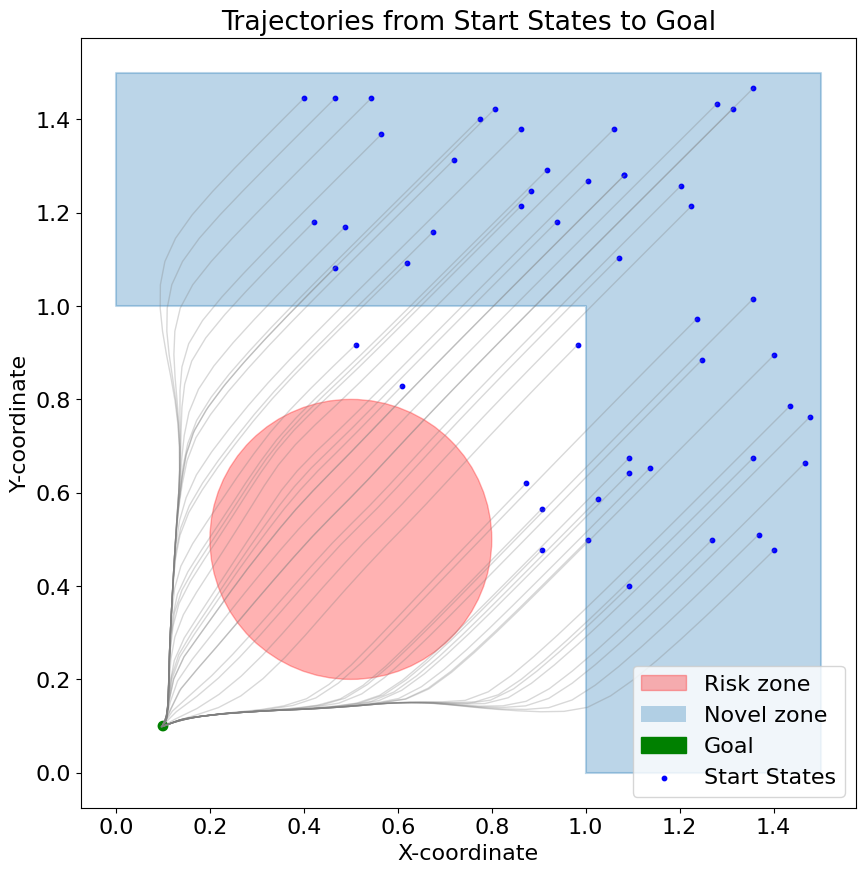

In [57]:
plot_trajectories(risky_policy)